# GRU model for blood suger prediction

In [3]:
import pandas as pd
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import os
import random
import json

import plotly.graph_objects as go
#import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_percentage_error, r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau

from ray import tune

## Import Data

In [3]:
#!wget -P Data https://raw.githubusercontent.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data/refs/heads/main/Data/train_multi_no_gaps.csv
#!wget -P Data https://github.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data/raw/refs/heads/main/Data/test_multi_no_gaps.csv
#!wget -P Data https://github.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data/raw/refs/heads/main/Data/test_p27_no_gaps.csv
#!wget -P Data https://github.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data/raw/refs/heads/main/Data/train_p27_no_gaps.csv


--2025-01-25 22:05:41--  https://raw.githubusercontent.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data/refs/heads/main/Data/train_multi_no_gaps.csv
CA-Zertifikat »/etc/ssl/certs/ca-certificates.crt« wurde geladen
Auflösen des Hostnamens raw.githubusercontent.com (raw.githubusercontent.com)… 2606:50c0:8001::154, 2606:50c0:8000::154, 2606:50c0:8002::154, ...
Verbindungsaufbau zu raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8001::154|:443 … verbunden.
HTTP-Anforderung gesendet, auf Antwort wird gewartet … 200 OK
Länge: 18233202 (17M) [text/plain]
Wird in »Data/train_multi_no_gaps.csv« gespeichert.

train_multi_no_gaps 100%[===================>]  17,39M  31,7MB/s    in 0,5s    

2025-01-25 22:05:42 (31,7 MB/s) - »Data/train_multi_no_gaps.csv« gespeichert [18233202/18233202]

--2025-01-25 22:05:42--  https://github.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data/raw/refs/heads/main/Data/test_multi_no_gaps.csv
CA-Zertifikat »/etc/ssl/c

In [ ]:
#!git clone https://github.com/ChristopherKunze-Git/AdvancedTimeSeriesCourse-Engineering-Data.git

In [8]:
# read in data
data_path=r'Data'
from datetime import datetime
dateparse = lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S')

train_multi = pd.read_csv(os.path.join(data_path,'train_multi_no_gaps.csv'), date_format="%Y-%m-%dT%H:%M:%S")#, index_col="time")
test_multi = pd.read_csv(os.path.join(data_path,'test_multi_no_gaps.csv'), date_format="%Y-%m-%dT%H:%M:%S") #sep=';', date_format="%Y-%m-%dT%H:%M:%S", index_col="time")
train_p27 = pd.read_csv(os.path.join(data_path,'train_p27_no_gaps.csv'), date_format="%Y-%m-%dT%H:%M:%S") #sep=';', date_format="%Y-%m-%dT%H:%M:%S", index_col="time")
test_p27 = pd.read_csv(os.path.join(data_path,'test_p27_no_gaps.csv'), date_format="%Y-%m-%dT%H:%M:%S") #sep=';', date_format="%Y-%m-%dT%H:%M:%S", index_col="time")

test_p27 = test_p27.drop(columns={'old_time'})
train_p27 = train_p27.drop(columns={'old_time'})
test_multi = test_multi.drop(columns={'old_time'})
train_multi = train_multi.drop(columns={'old_time'})
#test_p27=test_p27.rename(columns={'old_time': 'time'})
#train_p27=train_p27.rename(columns={'old_time': 'time'})

train_multi['time'] = pd.to_datetime(train_multi['time'])
test_multi['time'] = pd.to_datetime(test_multi['time'])
train_p27['time'] = pd.to_datetime(train_p27['time'])
test_p27['time'] = pd.to_datetime(test_p27['time'])


In [6]:
print(train_p27.columns)

Index(['time', 'subj', 'glucose', 'burned_calories', 'heart_rate',
       'basal_insulin', 'bolus_insulin', 'hour_of_day', 'hour_sin', 'hour_cos',
       'heart_rate_imp', 'glucose_imp'],
      dtype='object')


In [9]:
#create a multiindex dataframe
train_multi = train_multi.set_index(['subj', 'time'])
test_multi = test_multi.set_index(['subj', 'time'])
train_p27 = train_p27.set_index(['subj', 'time'])
test_p27 = test_p27.set_index(['subj', 'time'])
train_multi.head()

glucose  burned_calories  heart_rate  \
subj time                                                           
P01  2018-06-13 18:45:00  329.333333           7.7280   83.740157   
     2018-06-13 18:50:00  326.666667           4.7495   80.525180   
     2018-06-13 18:55:00  320.000000           6.3595   89.129032   
     2018-06-13 19:00:00  314.333333           5.1520   92.495652   
     2018-06-13 19:05:00  310.333333           6.6010   92.000000   

                          basal_insulin  bolus_insulin  time_of_day  hour_sin  \
subj time                                                                       
P01  2018-06-13 18:45:00       0.091667            0.0        18.75 -0.980785   
     2018-06-13 18:50:00       0.091667            0.0        18.83 -0.976485   
     2018-06-13 18:55:00       0.091667            0.0        18.92 -0.971134   
     2018-06-13 19:00:00       0.075000            0.0        19.00 -0.965926   
     2018-06-13 19:05:00       0.075000            0.0        19.08 -0.960294   

                          hour_cos  heart_rate_imp  glucose_imp  
subj time                                                        
P01  2018-06-13 18:45:00  0.195090       83.740157   329.333333  
     2018-06-13 18:50:00  0.215588       80.525180   326.666667  
     2018-06-13 18:55:00  0.238533       89.129032   320.000000  
     2018-06-13 19:00:00  0.258819       92.495652   314.333333  
     2018-06-13 19:05:00  0.278991       92.000000   310.333333

## GRU Model

### functions

In [10]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
set_seed()

In [29]:
# Applies the windowing process to a DataFrame grouped by subject ID

def window_per_subject(df, look_back, look_infuture=1, drop_features=False, subj_col='subj',
                                  time_col='time', target_col='glucose'):
    """
        Applies the windowing process to a DataFrame grouped by subject ID., using sliding_window_view()
    Parameters:
        df (pd.DataFrame): The input DataFrame containing subject data, with `subj_col`, `time_col`, and target column.
        look_back (int): The number of past time steps to include in each window.
        look_infuture (int): The number of future steps to include in the output window.
        drop_features (bool): If True, only the target column is included in the `y` output.
        subj_col (str): The column name identifying subjects.
        time_col (str): The column name representing time.
        target_col (str): The column name to use as the primary target.

    Returns:
        dict: A dictionary with `subj_id` as keys and (X, y) arrays as values.
    """
    target_index = 0
    # Ensure the target column is present in the DataFrame
    if df.ndim > 1:  # DataFrame
        if target_col not in df.columns:
          raise ValueError(f"Target column '{target_col}' not found in DataFrame.")
        target_index = df.columns.get_loc(target_col)

    X, y = [], []

    for subj_id, group in df.groupby(level='subj'):
        # Convert to NumPy for sliding_window_view processing
        data = group.to_numpy()
        # Create sliding windows for X and y
        windowed_data = sliding_window_view(data, look_back + look_infuture, axis=0)
        if data.ndim > 1:
          windowed_data = windowed_data.transpose((0, 2, 1))
        x_windows = windowed_data[:, :look_back]  # Input windows
        #print(look_back + look_infuture)#windowed_data[0,look_back:(look_back + look_infuture)])
        if not drop_features or data.ndim == 1 : #
          y_windows = windowed_data[:, look_back:(look_back + look_infuture)]  # Include all features in y
        else:
          y_windows = windowed_data[:, look_back:(look_back + look_infuture), target_index]  # Target windows
        #print("Windowed data shape:", windowed_data.shape)

        # Append to results
        X.append(x_windows)
        y.append(y_windows)

    # Concatenate results across all subjects
    X = np.concatenate(X, axis=0)
    y = np.concatenate(y, axis=0)

    return X, y

In [30]:
def interactiv_plot(df, plot_columns=['glucose'], plot_title='glucose'):
  #df.columns = [col.replace("AAPL.", "") for col in df.columns]

  # Create figure
  fig = go.Figure()
  for col in plot_columns:
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(df[col]), name=col))

  # Set title
  fig.update_layout(
      title_text=plot_title + ' data'#"Time series with range slider and selectors"
      )

  # Add range slider
  fig.update_layout(
      xaxis=dict(
          rangeselector=dict(
              buttons=list([
                  dict(count=1,
                      label="1d",
                      step="day",
                      stepmode="backward"),
                  dict(count=3,
                      label="3d",
                      step="day",
                      stepmode="backward"),
                  dict(count=1,
                      label="1m",
                      step="month",
                      stepmode="backward"),
                  dict(step="all")
              ])
          ),
          rangeslider=dict(
              visible=True
          ),
          type="date"
      )
  )

  fig.show()

In [31]:
def save_json(modelname, model_dict, output_file='saved_models/models.json'):
    # If the JSON file exists, load and update it; otherwise, create a new one
    # Initialize the dictionary to store models
    training_data = {}
    if os.path.exists(output_file):
        with open(output_file, 'r') as f:
            model_data = json.load(f)  # Load existing collection
    else:
        model_data = {}  # Initialize an empty collection
    
    # Add or update the new training info under model_name
    model_data[modelname] = model_dict
    
    # Save the updated collection back to the file
    with open(output_file, 'w') as f:
        json.dump(model_data, f, indent=4)

    print(f"Model {modelname} info updated in {output_file}")


In [32]:
def load_model_info(model_name, json_file_path='saved_models/models.json'):
    """
    Load model information from a JSON file for a specific model.

    Parameters:
        model_name (str): The name of the model to retrieve from the JSON.
        json_file_path (str): Path to the JSON file containing the model data.

    Returns:
        dict: The model information for the specified model name.
    """
    try:
        with open(json_file_path, 'r') as file:
            model_data = json.load(file)
        
        # Check if the model exists in the loaded data
        if model_name in model_data:
            return model_data[model_name]
        else:
            print(f"Model {model_name} not found in the JSON file.")
            return None
    except FileNotFoundError:
        print(f"File {json_file_path} not found.")
        return None
    except json.JSONDecodeError:
        print("Error decoding JSON.")
        return None


In [33]:
def build_gru_from_json(modelname, X_train, y_train, json_file="saved_models/models.json"):
    """
    Rebuilds a GRU model from a saved JSON file based on the model name.
    
    Parameters:
        model_name (str): The name of the model to rebuild.
        json_file (str): The path to the JSON file containing model information.
        
    Returns:
        model: A compiled GRU model reconstructed using the saved parameters.
    """
    # Load the JSON file
    with open(json_file, 'r') as f:
        model_data = json.load(f)

    # Check if the model exists in the JSON file
    if modelname not in model_data:
        raise ValueError(f"Model '{modelname}' not found in the JSON file.")

    # Fetch the model information from the JSON
    model_info = model_data[modelname]
    layer_params = model_info.get('layer_parameters', [])
    #print(layer_params)
    input_shape = (X_train.shape[1], X_train.shape[2] if X_train.ndim > 2 else 1)
    output_shape = (X_train.shape[1], X_train.shape[2] if X_train.ndim > 2 else 1)
    
    # Create the model based on layer parameters
    model = Sequential(name=modelname)
    
    # Loop through the layer parameters and add them to the model
    for layer in layer_params:
        if layer['layer_type'] == 'GRU':
            model.add(GRU(units=layer['units'], activation=layer['activation'], 
                          input_shape=input_shape, return_sequences=layer.get('return_sequences', False)))
        elif layer['layer_type'] == 'Dropout':
            model.add(Dropout(layer['rate']))
        elif layer['layer_type'] == 'Dense':
            model.add(Dense(units=layer['units']))
        else:
            raise ValueError(f"Unknown layer type: {layer['layer_type']}")
    model.add(Dense(units=y_train.shape[1]))
    
    # Use the learning rate and optimizer passed as parameters
    learning_rate = model_info["learning_rate"]
    if model_info['optimizer'] == 'Adam':
        optimizer_instance = Adam(learning_rate=learning_rate)
    else:
        raise ValueError(f"Unknown optimizer: {optimizer}")
    
    # Compile the model using the saved loss function and optimizer
    model.compile(loss=model_info['loss'], optimizer=optimizer_instance, metrics=model_info['metrics'])
    #model.compile(loss='mean_squared_error', optimizer='Adam', metrics=['mape'])
    model.summary()

    
    # Return the reconstructed model
    return model, model_info['batch_size'], model_info['epochs']

In [34]:
def plot_training_metrics(history, loss_key='loss', mape_key='mape', title='Training Loss and MAPE'):
    """
    Plot training loss and MAPE on separate axes.
    
    Parameters:
        history (dict): Dictionary containing the training history (e.g., `history.history` from TensorFlow).
        loss_key (str): Key in `history` for the loss values (default: 'loss').
        mape_key (str): Key in `history` for the MAPE values (default: 'mape').
        title (str): Title of the plot (default: 'Training Loss and MAPE').
    """
    # Create a figure and axis
    fig, ax1 = plt.subplots()

    # Plot loss on the first axis
    ax1.plot(history[loss_key], label='Training Loss', color='blue')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # Create a second y-axis sharing the same x-axis
    ax2 = ax1.twinx()
    ax2.plot(history[mape_key], label='MAPE', color='orange')
    ax2.set_ylabel('MAPE (%)', color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')

    # Add legends for clarity
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')

    # Add title and show the plot
    plt.title(title)
    plt.show()


In [35]:
def load_from_csv(file_path):
    """
    Load the true values and forecasts from a CSV file.

    Parameters:
        file_path (str): Path to the CSV file containing columns 'y_test' and 'forecasts'.

    Returns:
        pd.DataFrame: DataFrame containing the 'y_test' and 'forecasts' columns.
    """
    # Load the data from CSV
    data = pd.read_csv(file_path)

    # Ensure the required columns are present
    if 'y_test' not in data.columns or 'forecasts' not in data.columns:
        raise ValueError("CSV file must contain 'y_test' and 'forecasts' columns.")

    return data

def plot_forecast(data,  start_index=0, end_index=None):
    """
    Plot the true values and forecasts.

    Parameters:
        data (pd.DataFrame): DataFrame containing 'y_test' and 'forecasts' columns.
        start_index (int): Starting index for the data slice (inclusive).
        end_index (int, optional): Ending index for the data slice (exclusive). If None, it will slice to the end.
    """
    # Ensure the index is datetime
    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.date_range(start="2000-01-01 00:00:00", periods=len(data), freq="5min")

    # Slice the data for the specified range
    sliced_data = data.iloc[start_index:end_index]
    interactiv_plot(sliced_data,['y_test','forecasts'], plot_title="forcast")

def evaluate(data):
    """
    Calculate RMSE, MAPE, and R² from the true values and forecasts.

    Parameters:
        data (pd.DataFrame): DataFrame containing 'y_test' and 'forecasts' columns.

    Returns:
        dict: Dictionary containing RMSE, MAPE, and R² scores.
    """
    # Extract true values and predictions
    y_test = data['y_test'].values
    forecasts = data['forecasts'].values

    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(y_test, forecasts))
    mape = mean_absolute_percentage_error(y_test, forecasts)
    r2 = r2_score(y_test, forecasts)

    # Return metrics as a dictionary
    return {
        "rmse": rmse,
        "mape": mape,
        "r2": r2 }


In [36]:

def scale_dataframe(df, scaler, feature_index=None):
    """
    Scales a DataFrame or Series using the provided scaler.

    Parameters:
        df (pd.DataFrame or pd.Series): The data to be scaled.
        scaler: A fitted scaler object (e.g., StandardScaler or MinMaxScaler).
        feature_index (int or None): The index of the feature to scale. If None, scales all features.

    Returns:
        pd.DataFrame or pd.Series: The scaled data.
    """
    # If only one feature is given
    if feature_index is not None:
        # Scale only the specific feature (given by feature_index)
        placeholder = np.zeros((len(df), scaler.scale_.shape[0]))
        placeholder[:, feature_index] = df.values

        # Apply scaling
        scaled_array = scaler.transform(placeholder)
        scaled_array = scaled_array[:, feature_index]# drop placeholders
        # Update the original feature with the scaled data
        # Create a new DataFrame with the scaled values, retaining index and column names
        #df = pd.Series(scaled_data, index=df.index, columns=df.columns)
        df = pd.Series(scaled_array, index=df.index, name=df.name)
    
    # If feature_index is None, scale all features
    else:
        # Apply scaling to all columns
        scaled_data = scaler.transform(df)

        # Return the scaled DataFrame
        df.iloc[:, :] = scaled_data

    return df


def undo_scaling(scaler, scaled_data, feature_index=0):
    """
    Undo scaling for all sequences in one go and restore the sequence format.
    Parameters:
        scaler: Fitted scaler used for scaling the original data.
        scaled_data (np.ndarray): Scaled array of shape (n_sequences, sequence_length).
        feature_index (int): Index of the feature to undo scaling for.
    Returns:
        np.ndarray: Array with original scale, restored to the original sequence shape.
    """
    # Flatten the data (combine sequences)
    flattened_data = scaled_data.reshape(-1, 1)

    # Placeholder for inverse transform
    n_features = scaler.scale_.shape[0]
    placeholder = np.zeros((len(flattened_data), n_features))
    placeholder[:, feature_index] = flattened_data[:, 0]

    # Undo scaling
    inversed_flattened = scaler.inverse_transform(placeholder)

    # Extract the feature and reshape to the original sequence structure
    original_scale_data = inversed_flattened[:, feature_index].reshape(scaled_data.shape)

    return original_scale_data


#### read models from models.json


In [26]:
with open('saved_models/models.json') as data_file:
    data_loaded = json.load(data_file)
    
data_loaded['mvar_GRU_64-32_relu_120-60min_p27']

{'lookback': 24,
 'into_future': 12,
 'training_set': 'train_p27',
 'features': ['glucose',
  'heart_rate_imp',
  'burned_calories',
  'basal_insulin',
  'bolus_insulin',
  'hour_sin',
  'hour_cos'],
 'scaler': 'standard',
 'layer_parameters': [{'layer_type': 'GRU',
   'units': 64,
   'activation': 'relu',
   'return_sequences': True},
  {'layer_type': 'Dropout', 'rate': 0.2},
  {'layer_type': 'GRU',
   'units': 32,
   'activation': 'relu',
   'return_sequences': False},
  {'layer_type': 'Dropout', 'rate': 0.2}],
 'optimizer': 'Adam',
 'loss': 'mean_absolute_error',
 'learning_rate': 0.001,
 'metrics': ['mape', 'mae'],
 'batch_size': 32,
 'epochs': 25,
 'training_loss': [],
 'training_mape': [],
 'metrics_test_p27': {'rmse': 0, 'mape': 0, 'r2': 0},
 'metrics_test_multi': {'rmse': 0, 'mape': 0, 'r2': 0}}

In [21]:
with open('saved_models/models.json', 'r') as file:
    model_data = json.load(file)
        
# Print all model names (keys of the dictionary)
model_names = list(model_data.keys())

In [22]:
model_names

['uvar_GRU_64_relu_60-30min_p27',
 'uvar_GRU_64_relu_60-45min_p27',
 'uvar_GRU_64_relu_60-60min_p27',
 'uvar_GRU_64-32_relu_60-60min_p27_batch32',
 'uvar_GRU_64-32_relu_60-60min_p27_batch128',
 'uvar_GRU_64-32_tanh_60-60min_p27',
 'uvar_GRU_64-32_tanh_120-60min_p27',
 'uvar_GRU_64-32_relu_120-60min_p27',
 'uvar_GRU_64-32_relu_120-60min_multi',
 'uvar_GRU_64_relu_120-60min_multi',
 'uvar_GRU_64_tanh_120-60min_multi',
 'uvar_GRU_64_relu_60-60min_multi',
 'uvar_GRU_64_relu_60-45min_multi',
 'uvar_GRU_64_relu_60-30min_multi',
 'uvar_GRU_128_relu_60-60min_multi',
 'mvar_GRU_64-32_relu_120-60min_p27',
 'mvar_GRU_64_relu_120-60min_p27',
 'mvar_GRU_64_relu_120-60min_p27_batch8',
 'mvar_GRU_64_relu_240-60min_p27',
 'mvar_GRU_64_tanh_240-60min_p27_batch8',
 'mvar_GRU_64_tanh_240-60min_multi',
 'mvar_GRU_64-32-16_tanh_120-60min_p27',
 'mvar_GRU_64-32-16_tanh_120-60min_multi',
 'mvar_GRU_64-32-16_relu_120-60min_multi',
 'mvar_GRU_64-32_relu_120-60min_multi']

### Callbacks

In [37]:
# Directory to save the model
model_save_dir = "saved_models"
os.makedirs(model_save_dir, exist_ok=True)

# dictionary for metric results
metric_dict = {}

# Define callbacks
early_stopping = EarlyStopping(
    monitor='loss',          # Monitor training loss instead of validation loss
    patience=10,              # Stop after 5 epochs with no improvement
    restore_best_weights=True,  # Restore weights from the best epoch
    verbose=1
)

def create_model_checkpoint(model_name):
    m_checkpoint = ModelCheckpoint(
      filepath=os.path.join(model_save_dir, model_name+'.keras'),  # Save path
      monitor='loss',          # Save based on training loss
      save_best_only=True,     # Save only the best model
      verbose=1
    )
    return m_checkpoint

In [38]:
# Define the ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(
    monitor='loss',#'mape'  # Metric to monitor
    factor=0.5,          # Factor to reduce the learning rate
    patience=5,          # Number of epochs with no improvement to wait
    min_lr=1e-6          # Minimum learning rate
)

## Univariate GRU training

### univariate data

In [39]:
train_p27_glucose = train_p27['glucose_imp']#[['time','subj','glucose_imp']]
train_p27_glucose = train_p27_glucose.rename('glucose')

test_p27_glucose = test_p27['glucose_imp']#[['time','subj','glucose_imp']]
test_p27_glucose = test_p27_glucose.rename('glucose')

train_multi_glucose = train_multi['glucose_imp']#[['time','subj','glucose_imp']]
train_multi_glucose = train_multi_glucose.rename('glucose')

test_multi_glucose = test_multi['glucose_imp']#[['time','subj','glucose_imp']]
test_multi_glucose = test_multi_glucose.rename('glucose')

In [40]:
# Normalize the data using the Standard scaler
standard_scaler = StandardScaler().fit(train_multi)
standard_scaler.feature_names=train_multi.columns
minmax_scaler = MinMaxScaler().fit(train_multi)
minmax_scaler.feature_names=train_multi.columns

feature_pos = train_multi.columns.get_loc('glucose_imp')


In [41]:
train_p27_glucose

subj  time               
P27   2020-06-26 22:15:00    112.000000
      2020-06-26 22:20:00    105.000000
      2020-06-26 22:25:00     98.000000
      2020-06-26 22:30:00     91.000000
      2020-06-26 22:35:00     91.000000
                                ...    
      2021-08-19 08:50:00    139.333333
      2021-08-19 08:55:00    140.666667
      2021-08-19 09:00:00    142.000000
      2021-08-19 09:05:00    144.333333
      2021-08-19 09:10:00    146.666667
Name: glucose, Length: 120516, dtype: float64

### Run models

In [68]:
with open('saved_models/models.json', 'r') as file:
    model_data = json.load(file)
        
# Print all model names (keys of the dictionary)
model_names = list(model_data.keys())
# Filter model names starting with 'uvar'
uvar_models = [name for name in model_names if name.startswith('uvar')]
uvar_models

['uvar_GRU_64_relu_60-30min_p27',
 'uvar_GRU_64_relu_60-45min_p27',
 'uvar_GRU_64_relu_60-60min_p27',
 'uvar_GRU_64-32_relu_60-60min_p27_batch32',
 'uvar_GRU_64-32_relu_60-60min_p27_batch128',
 'uvar_GRU_64-32_tanh_60-60min_p27',
 'uvar_GRU_64-32_tanh_120-60min_p27',
 'uvar_GRU_64-32_relu_120-60min_p27',
 'uvar_GRU_64-32_relu_120-60min_multi',
 'uvar_GRU_64_relu_120-60min_multi',
 'uvar_GRU_64_tanh_120-60min_multi',
 'uvar_GRU_64_relu_60-60min_multi',
 'uvar_GRU_64_relu_60-45min_multi',
 'uvar_GRU_64_relu_60-30min_multi',
 'uvar_GRU_128_relu_60-60min_multi']

In [ ]:
# Run your code for all models starting with 'uvar'
for model_name in uvar_models:

    model_info = load_model_info(model_name)
    
    # Skip if "training_loss" is not empty
    if model_info.get("training_loss"):  # Check if "training_loss" exists and is not empty
        print(f"Skipping model: {model_name} as 'training_loss' is not empty.")
        continue  # Skip to the next model

    look_back = model_info["lookback"]#6 # 6*5min = 30min
    look_infuture = model_info["into_future"]

    print(f'{model_name}      {look_back*5} min -> {look_infuture*5} min')

    #pick a scaler
    scaler = minmax_scaler if model_info["scaler"] == "minmax" else standard_scaler
    print('scaler:' ,scaler)
    print('training_set:', model_info["training_set"])

    # scale data and create X and y
    if model_info["training_set"] == "train_p27":
        X_train, y_train = window_per_subject(scale_dataframe(train_p27_glucose, scaler,feature_pos), look_back, look_infuture)
    else:
        X_train, y_train = window_per_subject(scale_dataframe(train_multi_glucose, scaler,feature_pos),look_back, look_infuture)

    X_test_p27, y_test_p27 = window_per_subject(scale_dataframe(test_p27_glucose, scaler, feature_pos), look_back, look_infuture)
    X_test_multi, y_test_multi = window_per_subject(scale_dataframe(test_multi_glucose, scaler, feature_pos), look_back, look_infuture)


    # RUN TRAINING

    model_GRU, batch_size, epochs = build_gru_from_json(model_name, X_train, y_train,)

    model_checkpoint = create_model_checkpoint(model_name+'_cpoint')

    history_GRU = model_GRU.fit(
        x=X_train,
        y=y_train,
        epochs=epochs,            
        batch_size=batch_size,
        callbacks=[early_stopping, model_checkpoint,reduce_lr], 
        verbose=2
        )

    plot_training_metrics(history_GRU.history)
    
    model_save_path = f"saved_models/{model_name}.keras"
    model_GRU.save(model_save_path)

    #model_info = load_model_info(model_name)

    test_scenerio ={'p27':{'X_test':X_test_p27, 'y_test':y_test_p27},'multi':{'X_test':X_test_multi, 'y_test':y_test_multi}}


    for scenerio in test_scenerio:
        X_test, y_test = test_scenerio[scenerio]['X_test'], test_scenerio[scenerio]['y_test'], 
        # Make predictions
        scaled_forecasts_GRU = model_GRU.predict(X_test)
        #scaled_GRU_fits = model_GRU.predict(X_train)

        forecasts_GRU = undo_scaling(scaler, scaled_forecasts_GRU, feature_index=0)
        #GRU_fits = undo_scaling(standard_scaler, scaled_GRU_fits, feature_index=0)
        unscaled_y_test = undo_scaling(scaler, y_test, feature_index=0)

        # Save `y_test` and `forecasts_GRU` to a CSV file, assuming
        output_data = pd.DataFrame({
            'y_test': unscaled_y_test[:, -1].flatten(),  # Ensure y_test is a 1D array
            #'y_test': y_test[:, -1].flatten(),  # Ensure y_test is a 1D array
            'forecasts': forecasts_GRU[:, -1].flatten()  # Ensure forecasts_GRU is a 1D array
            #'forecasts': scaled_forecasts_GRU[:, -1].flatten()  # Ensure forecasts_GRU is a 1D array
        })
        # save data to file
        os.makedirs('forcasts', exist_ok=True)
        forcastfile = 'forcasts/'+model_name+'_'+scenerio+'.csv'
        output_data.to_csv(forcastfile, index=False)
        print('y_test and forcast save to file:', forcastfile)

        # Load the data from a CSV file
        #csv_file_path = forcastfile#'forcasts/'+model_name+'.csv'
        #output_data = load_from_csv(csv_file_path)

        # Plot the forecasted vs true values with date range shown on the plot
        plot_forecast(output_data)

        # Evaluate and print the metrics
        if model_name not in metric_dict:
            metric_dict[model_name] = {}
        metrics = evaluate(output_data)
        metric_dict[model_name][scenerio] = metrics
        print(metrics)

        model_info["metrics_test_"+scenerio] = metrics
        #model_info["metrics_test_multi"] = metrics

    # overwrite results
    model_info["loss"] = "mean_absolute_error"  # Example of editing the loss function
    model_info["training_loss"]= history_GRU.history['loss']
    model_info["training_mape"]= history_GRU.history['mape']

    save_json(model_name, model_info)

    

941/941 [==============================] - 9s 9ms/step
y_test and forcast save to file: forcasts/uvar_GRU_64-32_relu_120-60min_p27_p27.csv


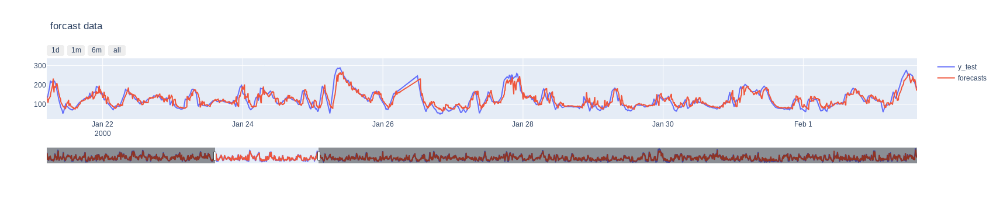

{'rmse': 23.61130771747823, 'mape': 0.15088947313204892, 'r2': 0.7390260105632336}
614/614 [==============================] - 6s 9ms/step
y_test and forcast save to file: forcasts/uvar_GRU_64-32_relu_120-60min_p27_multi.csv


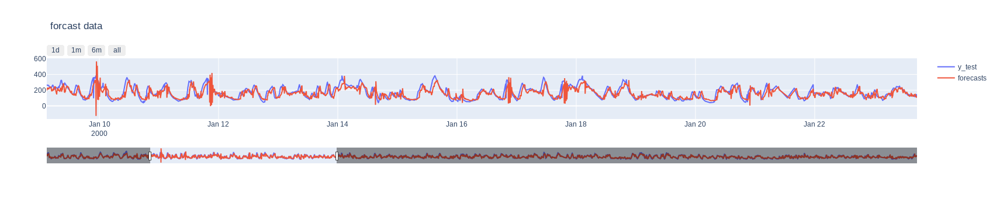

{'rmse': 41.29743674248364, 'mape': 0.21075486056168802, 'r2': 0.6622671755989937}
Model uvar_GRU_64-32_relu_120-60min_p27 info updated in saved_models/models.json


In [50]:
for scenerio in test_scenerio:
        X_test, y_test = test_scenerio[scenerio]['X_test'], test_scenerio[scenerio]['y_test'], 
        # Make predictions
        scaled_forecasts_GRU = model_GRU.predict(X_test)
        #scaled_GRU_fits = model_GRU.predict(X_train)

        forecasts_GRU = undo_scaling(scaler, scaled_forecasts_GRU, feature_index=0)
        #GRU_fits = undo_scaling(standard_scaler, scaled_GRU_fits, feature_index=0)
        unscaled_y_test = undo_scaling(scaler, y_test, feature_index=0)

        # Save `y_test` and `forecasts_GRU` to a CSV file, assuming
        output_data = pd.DataFrame({
            'y_test': unscaled_y_test[:, -1].flatten(),  # Ensure y_test is a 1D array
            #'y_test': y_test[:, -1].flatten(),  # Ensure y_test is a 1D array
            'forecasts': forecasts_GRU[:, -1].flatten()  # Ensure forecasts_GRU is a 1D array
            #'forecasts': scaled_forecasts_GRU[:, -1].flatten()  # Ensure forecasts_GRU is a 1D array
        })
        # save data to file
        os.makedirs('forcasts', exist_ok=True)
        forcastfile = 'forcasts/'+model_name+'_'+scenerio+'.csv'
        output_data.to_csv(forcastfile, index=False)
        print('y_test and forcast save to file:', forcastfile)

        # Load the data from a CSV file
        #csv_file_path = forcastfile#'forcasts/'+model_name+'.csv'
        #output_data = load_from_csv(csv_file_path)

        # Plot the forecasted vs true values with date range shown on the plot
        plot_forecast(output_data)

        # Evaluate and print the metrics
        if model_name not in metric_dict:
            metric_dict[model_name] = {}
        metrics = evaluate(output_data)
        metric_dict[model_name][scenerio] = metrics
        print(metrics)

        model_info["metrics_test_"+scenerio] = metrics
        #model_info["metrics_test_multi"] = metrics

    # overwrite results
model_info["loss"] = "mean_absolute_error"  # Example of editing the loss function
model_info["training_loss"]= history_GRU.history['loss']
model_info["training_mape"]= history_GRU.history['mape']

save_json(model_name, model_info)

### Autotune

In [ ]:
model_name="GRU_autotune"
look_back, look_infuture = 24, 12

X_train, y_train = window_per_subject(scale_dataframe(train_p27_glucose, scaler,feature_pos), look_back, look_infuture)

X_test_p27, y_test_p27 = window_per_subject(scale_dataframe(test_p27_glucose, standard_scaler, feature_pos), look_back, look_infuture)
X_test_multi, y_test_multi = window_per_subject(scale_dataframe(test_multi_glucose, standard_scaler, feature_pos), look_back, look_infuture)

In [55]:
def train_gru_tune(config, X_train, y_train):#, X_val, y_val):
    """
    Function for hyperparameter tuning of a GRU model with Ray Tune.
    
    Args:
        config (dict): Hyperparameter configuration sampled by Ray Tune.
        X_train, y_train: Training data.
        X_val, y_val: Validation data (not used here, but could be for tuning).
    
    Returns:
        Mean validation loss for hyperparameter tuning.
    """
    #Ensure univariate data is properly formatted
    if X_train.ndim == 2:
        # For univariate data, reshape to (samples, timesteps, 1)
        X_train = np.expand_dims(X_train, axis=-1)  
    
    # Check if y_train is 2D (for multiple outputs) or 1D (for a single output)
    if y_train.ndim == 1:
        y_train = np.expand_dims(y_train, axis=-1) 

    tf.keras.utils.set_random_seed(config["random_seed"])
    np.random.seed(config["random_seed"])

    # Build GRU model
    model = Sequential(name="GRU_Tune")
    
    for i in range(config["num_layers"]):
        return_seq = config["return_sequences"] if i < config["num_layers"] - 1 else False
        model.add(GRU(units=config["units"], activation=config["activation"],
                      return_sequences=return_seq, input_shape=(X_train.shape[1], X_train.shape[2])))

        if config["dropout_rate"] > 0:
            model.add(Dropout(config["dropout_rate"]))
    
    model.add(Dense(y_train.shape[1])) 

    if config["optimizer"] == "Adam":
        optimizer = Adam(learning_rate=config["learning_rate"])
    else:
        optimizer = RMSprop(learning_rate=config["learning_rate"])
    
    model.compile(loss="mse", optimizer=optimizer, metrics=["mse"])
    
    history = model.fit(X_train, y_train, 
                        #validation_data=(X_val, y_val),
                        batch_size=config["batch_size"], 
                        epochs=config["epochs"], 
                        verbose=0)
    
    train_loss = history.history["loss"][-1]

    # Return train loss to Ray Tune
    tune.report(loss=train_loss) 

In [56]:
gru_tune_config = {
    "units": tune.choice([32, 64, 128]),  # Number of GRU units per layer
    "activation": tune.choice(["relu", "tanh"]),  # Activation function
    "dropout_rate": tune.uniform(0.1, 0.5),  # Dropout rate
    "num_layers": tune.choice([1, 2, 3]),  # Number of GRU layers
    "return_sequences": tune.choice([True, False]),  # Whether to return sequences
    "learning_rate": tune.loguniform(1e-4, 1e-2),  # Learning rate
    "optimizer": tune.choice(["Adam", "RMSprop"]),  # Optimizer type
    "batch_size": tune.choice([8, 16, 32, 64]),  # Batch size
    "epochs": tune.choice([50, 100]),  # Number of training epochs
    "random_seed": tune.randint(1, 100)  # Random seed for reproducibility
}

In [ ]:
analysis = tune.run(
        tune.with_parameters(train_gru_tune, X_train=X_train, y_train=y_train),
        config=gru_tune_config,
        num_samples=5,
        #resources_per_trial={"cpu": cpus, "gpu": gpus},
        metric="loss",
        mode="min"  # Minimize validation loss
    )
    
    # Get best hyperparameters
best_config = analysis.best_config

## Multivariant GRU

### data

In [45]:
# Create _mvar dataframes, drop 'glucose' and 'heart_rate', rename 'glucose_imp' and 'heart_rate_imp'
train_p27_mvar = train_p27.drop(columns=['glucose', 'heart_rate']).rename(columns={'glucose_imp': 'glucose', 'heart_rate_imp': 'heart_rate'})
test_p27_mvar = test_p27.drop(columns=['glucose', 'heart_rate']).rename(columns={'glucose_imp': 'glucose', 'heart_rate_imp': 'heart_rate'})
train_multi_mvar = train_multi.drop(columns=['glucose', 'heart_rate']).rename(columns={'glucose_imp': 'glucose', 'heart_rate_imp': 'heart_rate'})
test_multi_mvar = test_multi.drop(columns=['glucose', 'heart_rate']).rename(columns={'glucose_imp': 'glucose', 'heart_rate_imp': 'heart_rate'})


In [46]:
train_p27_mvar.head()

burned_calories  basal_insulin  bolus_insulin  \
subj time                                                                 
P27  2020-06-26 22:15:00        22.655359          0.066            0.0   
     2020-06-26 22:20:00        21.161600          0.066            0.0   
     2020-06-26 22:25:00        25.642880          0.066            0.0   
     2020-06-26 22:30:00        12.572480          0.066            0.0   
     2020-06-26 22:35:00         6.721920          0.066            0.0   

                          hour_of_day  hour_sin  hour_cos  heart_rate  glucose  
subj time                                                                       
P27  2020-06-26 22:15:00           22      -0.5  0.866025   81.000000    112.0  
     2020-06-26 22:20:00           22      -0.5  0.866025   84.625000    105.0  
     2020-06-26 22:25:00           22      -0.5  0.866025   89.222222     98.0  
     2020-06-26 22:30:00           22      -0.5  0.866025   80.027778     91.0  
     2020-06-26 22:35:00           22      -0.5  0.866025   75.108108     91.0

In [66]:
## use train_multi as scaling reference
# Normalize the data using the Standard scaler
standard_scaler = StandardScaler().fit(train_multi_mvar)
standard_scaler.feature_names=train_multi_mvar.columns

minmax_scaler = MinMaxScaler().fit(train_multi_mvar)
minmax_scaler.feature_names=train_multi_mvar.columns

feature_pos = train_multi_mvar.columns.get_loc('glucose')


### train

In [48]:
with open('saved_models/models.json', 'r') as file:
    model_data = json.load(file)

# Print all model names (keys of the dictionary)
model_names = list(model_data.keys())
# Filter model names starting with 'uvar'
mvar_models = [name for name in model_names if name.startswith('mvar')]
mvar_models

['mvar_GRU_64-32_relu_120-60min_p27',
 'mvar_GRU_64_relu_120-60min_p27',
 'mvar_GRU_64_relu_120-60min_p27_batch8',
 'mvar_GRU_64_relu_240-60min_p27',
 'mvar_GRU_64_tanh_240-60min_p27_batch8',
 'mvar_GRU_64_tanh_240-60min_multi',
 'mvar_GRU_64-32-16_tanh_120-60min_p27',
 'mvar_GRU_64-32-16_tanh_120-60min_multi',
 'mvar_GRU_64-32-16_relu_120-60min_multi',
 'mvar_GRU_64-32_relu_120-60min_multi']

In [ ]:
# Run your code for all models starting with 'uvar'
for model_name in mvar_models:

    model_info = load_model_info(model_name)

    # Skip if "training_loss" is not empty
    if model_info.get("training_loss"):  # Check if "training_loss" exists and is not empty
        print(f"Skipping model: {model_name} as 'training_loss' is not empty.")
        continue  # Skip to the next model

    look_back = model_info["lookback"]#6 # 6*5min = 30min
    look_infuture = model_info["into_future"]
    epochs = model_info["epochs"]#6 # 6*5min = 30min
    batch_size = model_info["batch_size"]
    
    print(f'{model_name}      {look_back*5} min -> {look_infuture*5} min')

    #pick a scaler
    scaler = minmax_scaler if model_info["scaler"] == "minmax" else standard_scaler
    print('scaler:' ,scaler)
    print('training_set:', model_info["training_set"])

    # scale data and create X and y
    if model_info["training_set"] == "train_p27":
        X_train, y_train = window_per_subject(scale_dataframe(train_p27_mvar, scaler), look_back, look_infuture, drop_features=True)
    else:
        X_train, y_train = window_per_subject(scale_dataframe(train_multi_mvar, scaler),look_back, look_infuture, drop_features=True)

    X_test_p27, y_test_p27 = window_per_subject(scale_dataframe(test_p27_mvar, scaler), look_back, look_infuture, drop_features=True)
    X_test_multi, y_test_multi = window_per_subject(scale_dataframe(test_multi_mvar, scaler), look_back, look_infuture, drop_features=True)


    # RUN TRAINING

    model_GRU, batch_size, epochs = build_gru_from_json(model_name, X_train, y_train,)

    model_checkpoint = create_model_checkpoint(model_name+'_cpoint')

    history_GRU = model_GRU.fit(
        x=X_train,
        y=y_train,
        epochs=epochs,
        batch_size=batch_size,
        callbacks=[early_stopping, model_checkpoint,reduce_lr],
        verbose=2
        )

    plot_training_metrics(history_GRU.history)

    model_save_path = f"saved_models/{model_name}.keras"
    model_GRU.save(model_save_path)

    #model_info = load_model_info(model_name)

    test_scenerio ={'p27':{'X_test':X_test_p27, 'y_test':y_test_p27},'multi':{'X_test':X_test_multi, 'y_test':y_test_multi}}


    for scenerio in test_scenerio:
        X_test, y_test = test_scenerio[scenerio]['X_test'], test_scenerio[scenerio]['y_test'],
        # Make predictions
        scaled_forecasts_GRU = model_GRU.predict(X_test)
        #scaled_GRU_fits = model_GRU.predict(X_train)

        forecasts_GRU = undo_scaling(scaler, scaled_forecasts_GRU, feature_index=feature_pos)
        #GRU_fits = undo_scaling(standard_scaler, scaled_GRU_fits, feature_index=0)
        unscaled_y_test = undo_scaling(scaler, y_test, feature_index=feature_pos)

        # Save `y_test` and `forecasts_GRU` to a CSV file, assuming
        output_data = pd.DataFrame({
            'y_test': unscaled_y_test[:, -1].flatten(),  # Ensure y_test is a 1D array
            #'y_test': y_test[:, -1].flatten(),  # Ensure y_test is a 1D array
            'forecasts': forecasts_GRU[:, -1].flatten()  # Ensure forecasts_GRU is a 1D array
            #'forecasts': scaled_forecasts_GRU[:, -1].flatten()  # Ensure forecasts_GRU is a 1D array
        })
        # save data to file
        os.makedirs('forcasts', exist_ok=True)
        forcastfile = 'forcasts/'+model_name+'_'+scenerio+'.csv'
        output_data.to_csv(forcastfile, index=False)
        print('y_test and forcast save to file:', forcastfile)

        # Load the data from a CSV file
        #csv_file_path = forcastfile#'forcasts/'+model_name+'.csv'
        #output_data = load_from_csv(csv_file_path)

        # Plot the forecasted vs true values with date range shown on the plot
        plot_forecast(output_data)

        # Evaluate and print the metrics
        if model_name not in metric_dict:
            metric_dict[model_name] = {}
        metrics = evaluate(output_data)
        metric_dict[model_name][scenerio] = metrics
        print(metrics)

        model_info["metrics_test_"+scenerio] = metrics
        #model_info["metrics_test_multi"] = metrics

    # overwrite results
    model_info["loss"] = "mean_absolute_error"  # Example of editing the loss function
    model_info["training_loss"]= history_GRU.history['loss']
    model_info["training_mape"]= history_GRU.history['mape']

    save_json(model_name, model_info)



# Model comparison

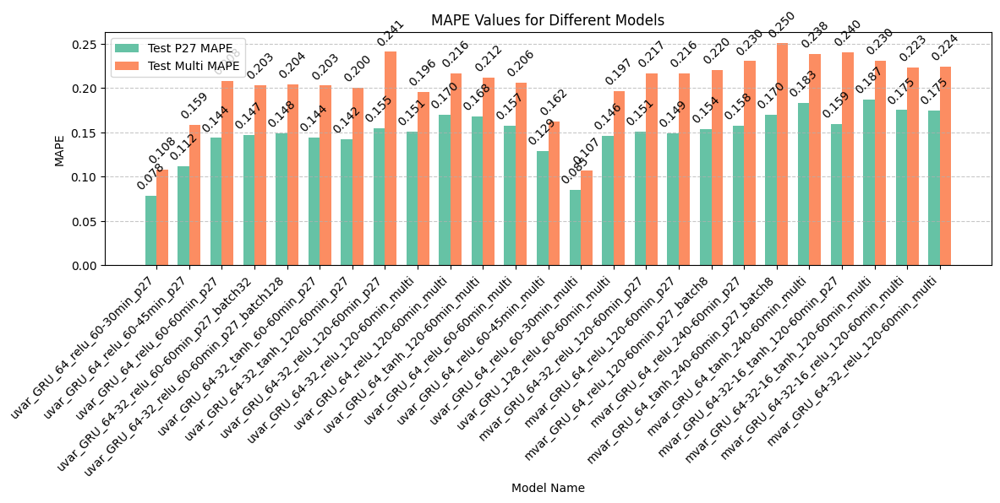

In [51]:
# Load the JSON file
with open("saved_models/models.json", "r") as file:
    models_data = json.load(file)

# Extract data for the DataFrame
data = {
    "model_name": [],
    "test_p27_mape": [],
    "test_multi_mape": []
}

for model_name, model_details in models_data.items():
    data["model_name"].append(model_name)
    data["test_p27_mape"].append(model_details.get("metrics_test_p27", {}).get("mape", None))
    data["test_multi_mape"].append(model_details.get("metrics_test_multi", {}).get("mape", None))

# Create a DataFrame
df = pd.DataFrame(data)

# Plot settings
x = np.arange(len(df["model_name"]))  # X positions for models
width = 0.35  # Bar width

fig, ax = plt.subplots(figsize=(12, 6))

# Plot bars for test_p27_mape and test_multi_mape
bar1 = ax.bar(x - width / 2, df["test_p27_mape"], width, label="Test P27 MAPE", color="#66c2a5")
bar2 = ax.bar(x + width / 2, df["test_multi_mape"], width, label="Test Multi MAPE", color="#fc8d62")

# Add labels, title, and legend
ax.set_xlabel("Model Name")
ax.set_ylabel("MAPE")
ax.set_title("MAPE Values for Different Models")
ax.set_xticks(x)
ax.set_xticklabels(df["model_name"], rotation=45, ha="right")
ax.legend()

# Annotate the bars with the exact MAPE values
for bar in bar1:
    height = bar.get_height()
    ax.annotate(f'{height:.3f}', 
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # Offset text slightly above bar
                textcoords="offset points",
                ha='center', va='bottom', rotation=45)

for bar in bar2:
    height = bar.get_height()
    ax.annotate(f'{height:.3f}', 
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # Offset text slightly above bar
                textcoords="offset points",
                ha='center', va='bottom',rotation=45)

# Add a grid for better readability
ax.grid(axis='y', linestyle="--", alpha=0.7)

# Tight layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

In [52]:
df

,model_name,test_p27_mape,test_multi_mape
0,uvar_GRU_64_relu_60-30min_p27,0.078276,0.108217
1,uvar_GRU_64_relu_60-45min_p27,0.111930,0.158721
2,uvar_GRU_64_relu_60-60min_p27,0.143628,0.207932
3,uvar_GRU_64-32_relu_60-60min_p27_batch32,0.146912,0.203486
4,uvar_GRU_64-32_relu_60-60min_p27_batch128,0.148445,0.204279
5,uvar_GRU_64-32_tanh_60-60min_p27,0.144325,0.202719
6,uvar_GRU_64-32_tanh_120-60min_p27,0.142211,0.199929
7,uvar_GRU_64-32_relu_120-60min_p27,0.154939,0.240767
8,uvar_GRU_64-32_relu_120-60min_multi,0.151007,0.195903
9,uvar_GRU_64_relu_120-60min_multi,0.169678,0.216307


### Note:
* mvar data should be recalculated due to an error 